# Desenvolvimento Filtro Passa Baixa

## Características Básicas

Analisando o sinal, podemos ver que o ruído se encontra na faixa 700 - 1700 Hz.

Foi decidido então que as frequências de corte do filtro devem se encontrar na faixa 0.6 - 1.8 kHz.

A janela selecionada foi a janela Kaiser, devido a sua boa resposta em frequência.

## Qualidade do Filtro

Analisando a FFT do sinal com ruido, o volume do ruído tem ~20 dB a mais que o sinal desejado, portanto se faz necessária uma atenuação de pelo menos 25 dB na região para garantir que o sinal seja removido.

## Filtro FIR

In [1]:
from IPython.display import display, Audio
from ipywidgets import interactive

import matplotlib.pyplot as plt
import scipy.io.wavfile as wavf
import scipy.signal as sp

import pandas as pd
import numpy as np

import DSP

df = pd.read_csv("coeffs_FIR_2.csv", header = None)
b  = np.array(df.values[:,0])
a  = np.zeros(len(b))
a[0] = 1.0

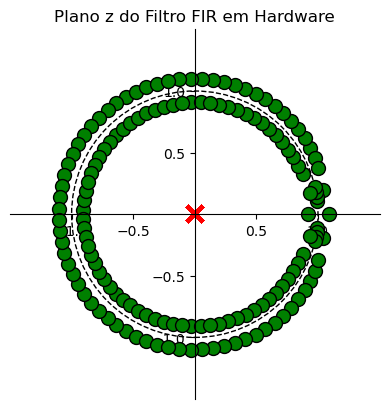

In [2]:
DSP.zplane(b, a, title = "Plano z do Filtro FIR em Hardware")
plt.show()

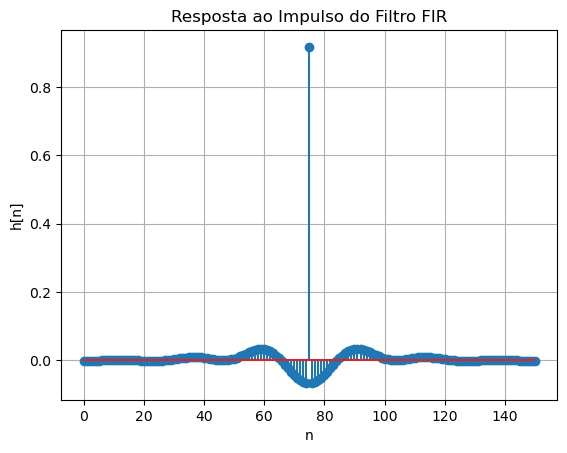

In [3]:
x = np.zeros(1000)
x[0] = 1
h = sp.lfilter(b, a, x)
plt.stem(h[:len(b)])
plt.title("Resposta ao Impulso do Filtro FIR")
plt.xlabel("n")
plt.ylabel("h[n]")
plt.grid(True, 'both')
plt.show()

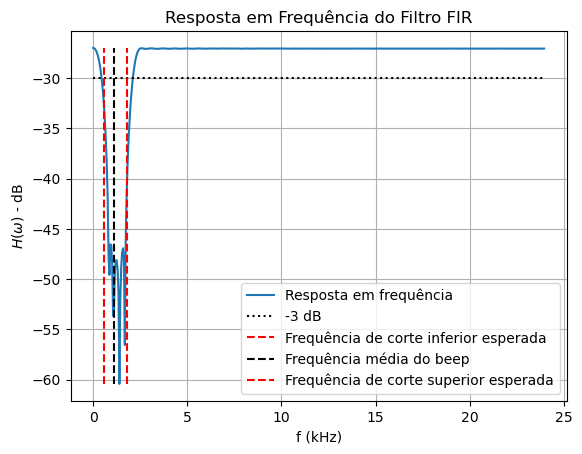

In [4]:
#DSP.plot_FFT(h, T=1/48e3, dB=True, title="Resposta em Frequência do Filtro")

[H, w] = DSP.get_FFT(h, 1/48)
H = 10*np.log10(np.abs(H)) # Converte para dB
plt.plot(w, H)
plt.title("Resposta em Frequência do Filtro FIR")
plt.ylabel("$H(\omega)$ - dB")
plt.xlabel("f (kHz)")
plt.grid(True, 'both')
plt.plot([w[0], w[-1]], [H[0]-3, H[0]-3], 'k:')
plt.plot([0.6, 0.6], [np.min(H), np.max(H)], 'r--')
plt.plot([1.1, 1.1], [np.min(H), np.max(H)], 'k--')
plt.plot([1.8, 1.8], [np.min(H), np.max(H)], 'r--')
plt.legend(['Resposta em frequência', '-3 dB', 'Frequência de corte inferior esperada', 'Frequência média do beep', "Frequência de corte superior esperada"],
           loc = 'lower right')
plt.show()

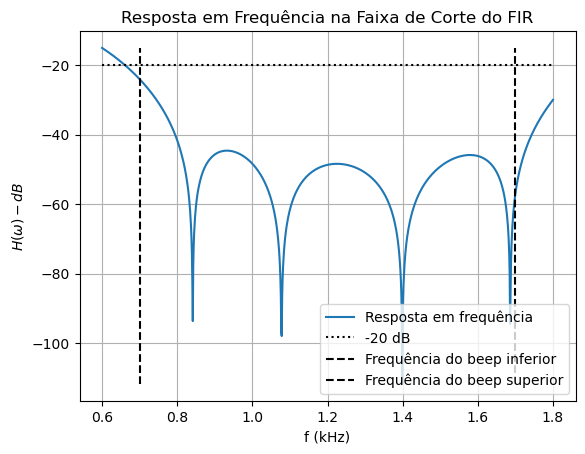

In [5]:
transform = sp.ZoomFFT(len(h), [0.6, 1.8], fs=48)
X = transform(h)
f = np.linspace(0.6, 1.8, len(h))
X = 10*np.log(np.abs(X))
# Resposta em frequência
plt.plot(f, X)
plt.title("Resposta em Frequência na Faixa de Corte do FIR")
plt.xlabel("f (kHz)")
plt.ylabel("$H(\omega) - dB$")
plt.grid(True, 'both')
# Atenuação desejada
plt.plot([f[0], f[-1]], [-20, -20], 'k:')
# Faixa do beep
plt.plot([0.7, 0.7], [np.min(X), np.max(X)], 'k--')
plt.plot([1.7, 1.7], [np.min(X), np.max(X)], 'k--')
# Legendas
plt.legend(['Resposta em frequência', '-20 dB', 'Frequência do beep inferior', "Frequência do beep superior"],
           loc = 'lower right')

plt.show()

In [6]:
[fs, raw_signal]    = wavf.read("Sinais/audio-teste-ruido-G4.wav")
converted_signal    = raw_signal/(float(1<<16) - 1)     # Converte de int16 para float
filtered_signal     = sp.lfilter(b, a, converted_signal)
filtered_signal     = DSP.normalize(filtered_signal)

wavf.write("Sinais/teste_coeffs_FIR.wav", fs, filtered_signal)

display(Audio(data=filtered_signal, rate = 48000, autoplay=True))

Podemos ver no resultado que um "fantasma" do beep ainda existe no áudio filtrado, mas o barulho do beep não é mais discernível e a voz agora está bem clara, mas a frequência parece levemente distorcida.

In [7]:
[fs, Hfiltered_signal]  = wavf.read("Sinais/Mic_Real.wav")
Hfiltered_signal        = (2**15*Hfiltered_signal[:, 0]).astype(int)
# Hfiltered_signal        = DSP.normalize(Hfiltered_signal)

display(Audio(data=Hfiltered_signal, rate = 48000, autoplay=True))

## Parâmetros Finais do Filtro FIR

$\beta = 3.5$

$N = 151$

$f_s = 48\space kHz$ (Frequência de Amostragem do STM)

$f_c = 450\space Hz$

$f_{c2} = 2.1\space kHz$ 

## Filtro IIR

In [8]:
df  = pd.read_csv("coeffs_IIR.csv", header = None)
sos = np.array(df.values)
[b, a] = sp.sos2tf(sos)

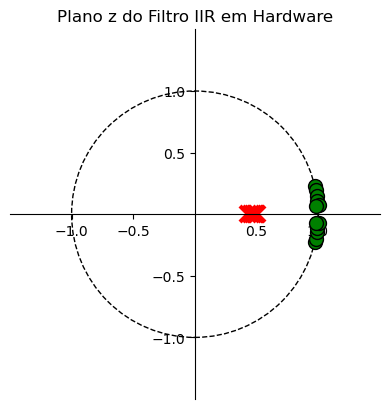

In [9]:
DSP.zplane(b, a, title = "Plano z do Filtro IIR em Hardware")
plt.show()

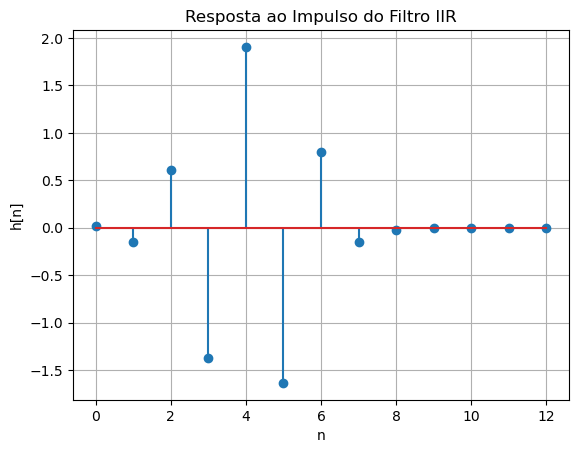

In [10]:
x = np.zeros(1000)
x[0] = 1
h = sp.lfilter(b, a, x)
plt.stem(h[:len(b)])
plt.title("Resposta ao Impulso do Filtro IIR")
plt.xlabel("n")
plt.ylabel("h[n]")
plt.grid(True, 'both')
plt.show()

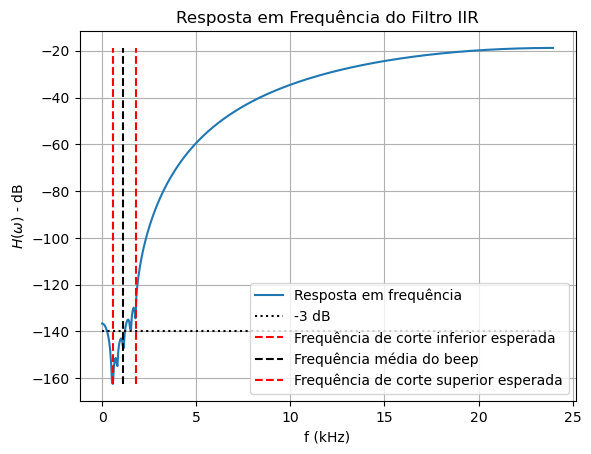

In [11]:
#DSP.plot_FFT(h, T=1/48e3, dB=True, title="Resposta em Frequência do Filtro")
[H, w] = DSP.get_FFT(h, 1/48)
H = 10*np.log10(np.abs(H)) # Converte para dB
plt.plot(w, H)
plt.title("Resposta em Frequência do Filtro IIR")
plt.ylabel("$H(\omega)$ - dB")
plt.xlabel("f (kHz)")
plt.grid(True, 'both')
plt.plot([w[0], w[-1]], [H[0]-3, H[0]-3], 'k:')
plt.plot([0.6, 0.6], [np.min(H), np.max(H)], 'r--')
plt.plot([1.1, 1.1], [np.min(H), np.max(H)], 'k--')
plt.plot([1.8, 1.8], [np.min(H), np.max(H)], 'r--')
plt.legend(['Resposta em frequência', '-3 dB', 'Frequência de corte inferior esperada', 'Frequência média do beep', "Frequência de corte superior esperada"],
           loc = 'lower right')
plt.show()

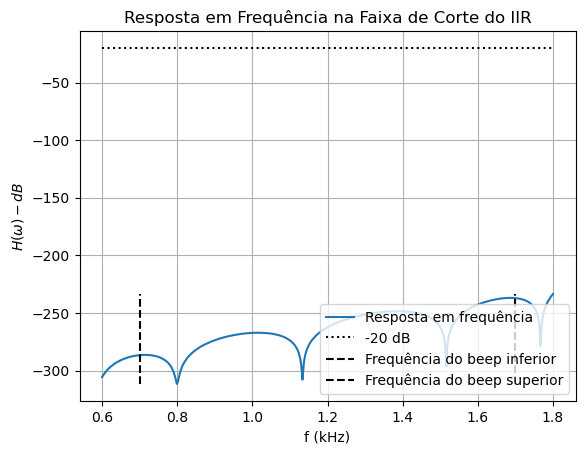

In [12]:
transform = sp.ZoomFFT(len(h), [0.6, 1.8], fs=48)
X = transform(h)
f = np.linspace(0.6, 1.8, len(h))
X = 10*np.log(np.abs(X))
# Resposta em frequência
plt.plot(f, X)
plt.title("Resposta em Frequência na Faixa de Corte do IIR")
plt.xlabel("f (kHz)")
plt.ylabel("$H(\omega) - dB$")
plt.grid(True, 'both')
# Atenuação desejada
plt.plot([f[0], f[-1]], [-20, -20], 'k:')
# Faixa do beep
plt.plot([0.7, 0.7], [np.min(X), np.max(X)], 'k--')
plt.plot([1.7, 1.7], [np.min(X), np.max(X)], 'k--')
# Legendas
plt.legend(['Resposta em frequência', '-20 dB', 'Frequência do beep inferior', "Frequência do beep superior"],
           loc = 'lower right')
plt.show()

## Atraso de Grupo / Resposta a Fase IIR

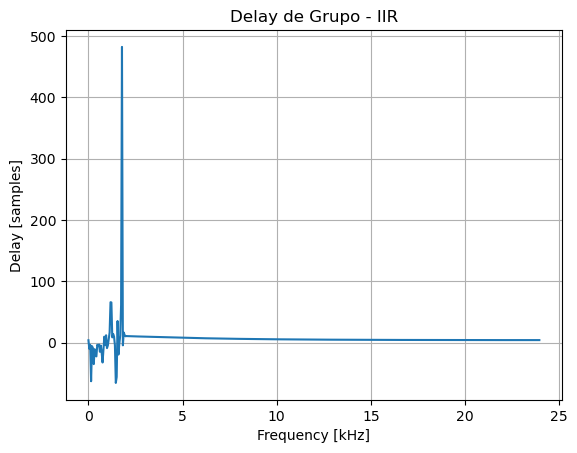

In [13]:
f, gd = sp.group_delay((b, a), fs=48)

plt.title('Delay de Grupo - IIR')
plt.plot(f, gd)
plt.ylabel('Delay [samples]')
plt.xlabel('Frequency [kHz]')
plt.grid(True)
plt.show()

Podemos ver que o atraso de grupo é relativamente constante para $f<5\space kHz$

Analisando a região $f<5\space kHz$:

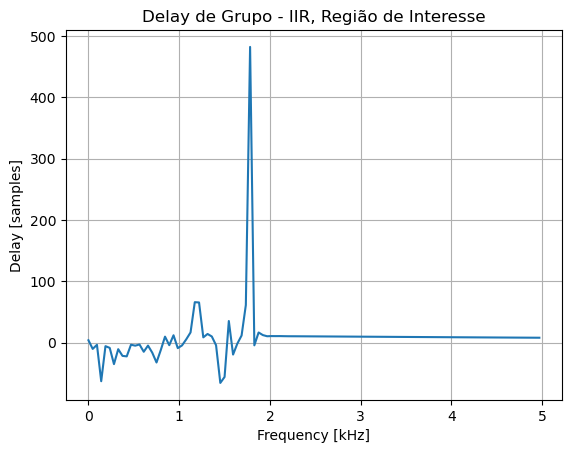

In [14]:
plt.title('Delay de Grupo - IIR, Região de Interesse')
plt.plot(f[f<5], gd[f<5])
plt.ylabel('Delay [samples]')
plt.xlabel('Frequency [kHz]')
plt.grid(True)
plt.show()

Podemos ver um atraso de grupo alto e com muita variância, isto pode ser um problema na aplicação real

In [15]:
# Atraso Máximo no Tempo

delay_max = np.max(gd)/fs
advnc_max = -(np.min(gd)/fs)
print("Atraso máximo no tempo causado pelo filtro:", round(delay_max, 3)*1e3, "ms")
print("Adiantamento máximo no tempo causado pelo filtro:", round(advnc_max, 3)*1e3, "ms")

Atraso máximo no tempo causado pelo filtro: 10.0 ms
Adiantamento máximo no tempo causado pelo filtro: 1.0 ms


In [16]:
[fs, raw_signal]    = wavf.read("Sinais/audio-teste-ruido-G4.wav")
converted_signal    = raw_signal/(float(1<<16) - 1)     # Converte de int16 para float
filtered_signal     = sp.lfilter(b, a, converted_signal)
filtered_signal     = DSP.normalize(filtered_signal)

wavf.write("Sinais/teste_coeffs_IIR.wav", fs, filtered_signal)
display(Audio(data=filtered_signal, rate = 48000, autoplay=True))

In [17]:
[fs, Hfiltered_signal]  = wavf.read("Sinais/Mic_IIR.wav")
Hfiltered_signal        = (2**15*Hfiltered_signal[:, 0]).astype(int)
# Hfiltered_signal        = DSP.normalize(Hfiltered_signal)

display(Audio(data=Hfiltered_signal, rate = 48000, autoplay=True))

## Parâmetros Finais do Filtro IIR

$N = 6$

$f_s = 48\space kHz$ (Frequência de Amostragem do STM)

$f_c = 500\space Hz$

$f_{c2} = 1.8e3\space kHz$ 

## Filtro IIR Notch

In [18]:
##
fs    = 48
w0    = 0.985 # => Frequência verficada empiricamente ao passa sinal pela placa
w0    = 2*np.pi*w0/fs
##
alpha = 2
ro    = 0.8
##
b     = np.array([1, -2*np.cos(w0), 1], dtype=np.float64)
a     = np.array([1, -2*ro*np.cos(w0), ro**2], dtype=np.float64)
## Aplicando Feedback
b     = (1+alpha)*b
a     = a + alpha*b
##
print("w0:", w0)
print("b :", b)
print("a :", a)

w0: 0.1289361984910811
b : [ 3.         -5.95019543  3.        ]
a : [  7.         -13.48710963   6.64      ]


In [19]:
sp.tf2sos(b, a)

array([[ 0.42857143, -0.85002792,  0.42857143,  1.        , -1.92672995,
         0.94857143]])

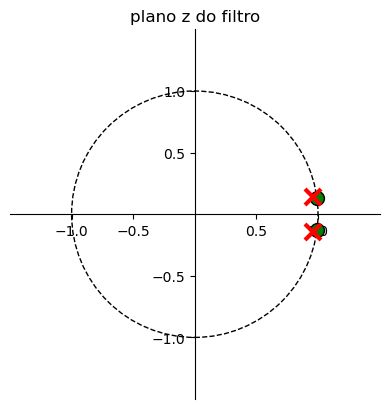

In [20]:
DSP.zplane(b, a)
plt.show()

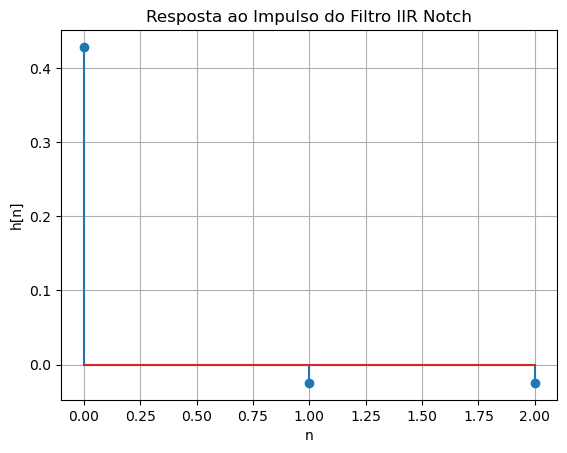

In [21]:
x = np.zeros(1000)
x[0] = 1
h = sp.lfilter(b, a, x)
plt.stem(h[:len(a)])
plt.title("Resposta ao Impulso do Filtro IIR Notch")
plt.xlabel("n")
plt.ylabel("h[n]")
plt.grid(True, 'both')
plt.show()

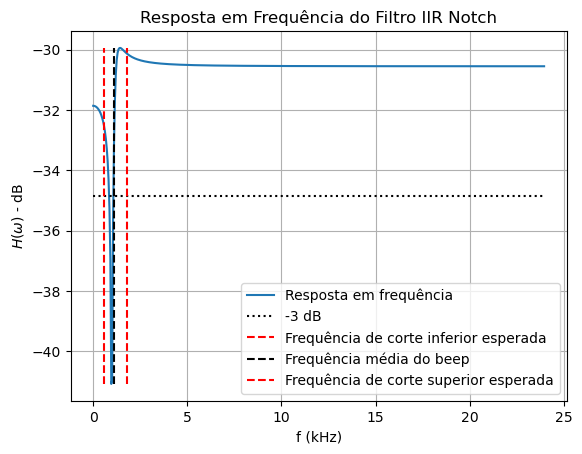

In [22]:
[H, w] = DSP.get_FFT(h, 1/48)
H = 10*np.log10(np.abs(H)) # Converte para dB
plt.plot(w, H)
plt.title("Resposta em Frequência do Filtro IIR Notch")
plt.ylabel("$H(\omega)$ - dB")
plt.xlabel("f (kHz)")
plt.grid(True, 'both')
plt.plot([w[0], w[-1]], [H[0]-3, H[0]-3], 'k:')
plt.plot([0.6, 0.6], [np.min(H), np.max(H)], 'r--')
plt.plot([1.1, 1.1], [np.min(H), np.max(H)], 'k--')
plt.plot([1.8, 1.8], [np.min(H), np.max(H)], 'r--')
plt.legend(['Resposta em frequência', '-3 dB', 'Frequência de corte inferior esperada', 'Frequência média do beep', "Frequência de corte superior esperada"],
           loc = 'lower right')
plt.show()

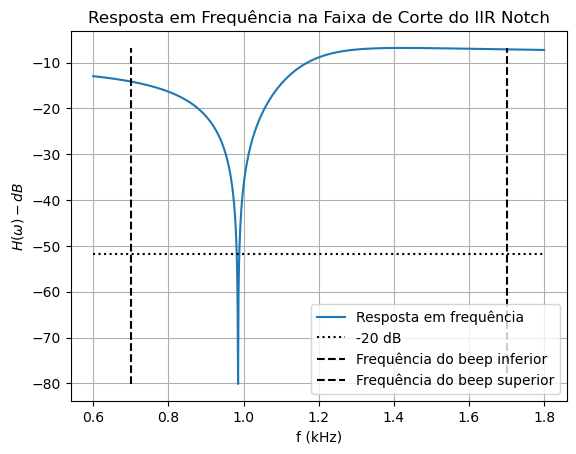

In [23]:
transform = sp.ZoomFFT(len(h), [0.6, 1.8], fs=48)
X = transform(h)
f = np.linspace(0.6, 1.8, len(h))
X = 10*np.log(np.abs(X))
# Resposta em frequência
plt.plot(f, X)
plt.title("Resposta em Frequência na Faixa de Corte do IIR Notch")
plt.xlabel("f (kHz)")
plt.ylabel("$H(\omega) - dB$")
plt.grid(True, 'both')
# Atenuação desejada
plt.plot([f[0], f[-1]], [H[0]-20, H[0]-20], 'k:')
# Faixa do beep
plt.plot([0.7, 0.7], [np.min(X), np.max(X)], 'k--')
plt.plot([1.7, 1.7], [np.min(X), np.max(X)], 'k--')
# Legendas
plt.legend(['Resposta em frequência', '-20 dB', 'Frequência do beep inferior', "Frequência do beep superior"],
           loc = 'lower right')
plt.show()

In [24]:
[fs, raw_signal]    = wavf.read("Sinais/audio-teste-ruido-G4.wav")
converted_signal    = raw_signal/(float(1<<16) - 1)     # Converte de int16 para float
filtered_signal     = sp.lfilter(b, a, converted_signal)
filtered_signal     = DSP.normalize(filtered_signal)

wavf.write("Sinais/teste_notch.wav", fs, filtered_signal)
display(Audio(data=filtered_signal, rate = 48000, autoplay=True))

In [25]:
[fs, Hfiltered_signal]  = wavf.read("Sinais/Mic_Notch.wav")
Hfiltered_signal        = (2**15*Hfiltered_signal[:, 0]).astype(int)
# Hfiltered_signal        = DSP.normalize(Hfiltered_signal)

display(Audio(data=Hfiltered_signal, rate = 48000, autoplay=True))

In [31]:
!pip install wget
import wget
!wget -O make.py https://raw.githubusercontent.com/JonasGMorsch/ColabMakePDF/master/make.py
import make; make.html()

'wget' n�o � reconhecido como um comando interno
ou externo, um programa oper�vel ou um arquivo em lotes.


AttributeError: module 'make' has no attribute 'html'